<a href="https://colab.research.google.com/github/HuyKhoi-code/fruits/blob/master/edge_with_cluster_valid.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

In [4]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import accuracy_score

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [3]:
train = pd.read_csv('/content/drive/My Drive/Fruit recognition/output_input/25_cluster_features_1_train.csv')
test = pd.read_csv ('/content/drive/My Drive/Fruit recognition/output_input/25_cluster_features_1_test.csv')

In [5]:
label_train = train['name']
features_train = train.drop(['name'], axis = 1)
label_test = test['name']
features_test = test.drop(['name'], axis = 1)

In [6]:
models = []
models.append(('rfc', RandomForestClassifier()))
models.append(('svc', SVC()))
models.append(('knn', KNeighborsClassifier()))


for name, model in models:
  print(name)
  model.fit(features_train, label_train)
  pred = model.predict(features_test)
  print('\ttest', accuracy_score(label_test, pred))

rfc
	test 0.8365079365079365
svc
	test 0.8269841269841269
knn
	test 0.7142857142857143


In [7]:
svc = SVC()
svc.fit (features_train, label_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [14]:
def clustering_image(img):
  #img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
  vectorized = img.reshape((-1,3))
  vectorized = np.float32(vectorized)
  criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
  K = 2
  attempts=10
  ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
  center = np.uint8(center)
  res = center[label.flatten()]
  result_image = res.reshape((img.shape))
  return result_image, center

In [15]:
def remove_light_color(img, center_color):
  light_color = max(sum(center_color[0]), sum(center_color[1]))
  for x in range(img.shape[0]):
    for y in range(img.shape[1]):
      if sum(img[x][y]) == light_color:
        img[x][y][0]=0
        img[x][y][1]=0
        img[x][y][2]=0
  return img

In [16]:
def Canny(img):
    img, center = clustering_image(img)
    img = remove_light_color(img, center)
    #gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(img, (3,3), 0)
    edge = cv2.Canny(blur, 70 ,50)
    return edge

In [17]:
def features_grid(img):
    features = np.array([], dtype='uint8')
    section = 1
    
    for y in range(0, img.shape[0], 40):
        for x in range(0, img.shape[1], 40):
            
            # Cropping the image into a section.
            section_img = img[y:y+40, x:x+40]
            
            # Claculating the mean and stdev of the sectioned image.
            section_mean = np.mean(section_img)
            section_std = np.std(section_img)
            
            # Appending the above calculated values into features array.
            features = np.append(features, [section_mean, section_std])
    
    # Returning the features array.
    return features

In [18]:
def create_df_with_one_image2(img):
  feature_name = []
  section = 1
  for y in range(0, 200, 40):
      for x in range(0, 200, 40):
          feature_name.append(f"sec{section}_mean")
          feature_name.append(f"sec{section}_std")
          section += 1
  
  all_imgs = np.zeros((1, 50), dtype='uint8')

  name = []
  section_mean = []
  section_std = []

  img = Canny(img)

  img_features = features_grid(img)
  img_features = img_features.reshape(1, img_features.shape[0])

  all_imgs = np.append(all_imgs, img_features, axis=0)
  all_imgs = all_imgs[1:]

  df = pd.DataFrame(all_imgs, columns= feature_name)
  return df

tao


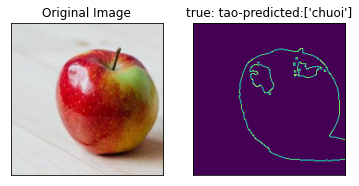

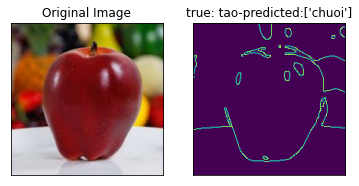

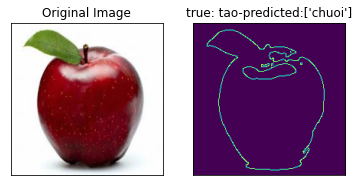

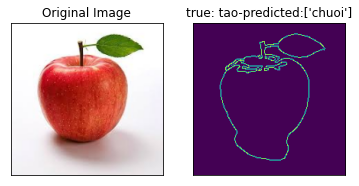

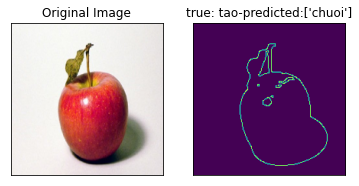

...

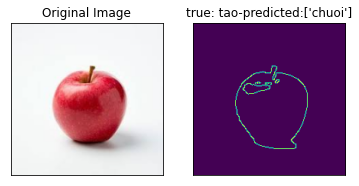

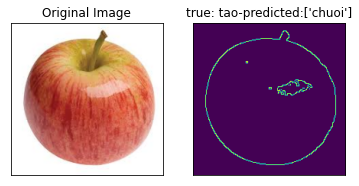

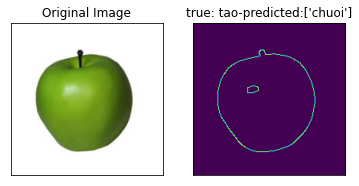

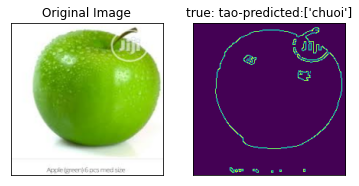

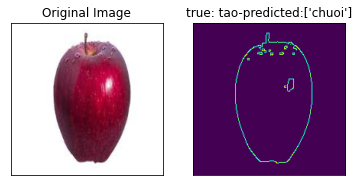

21/21 wrong
nho


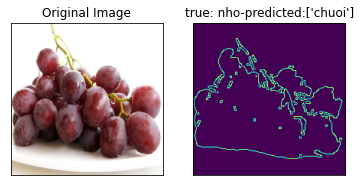

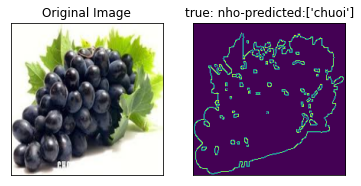

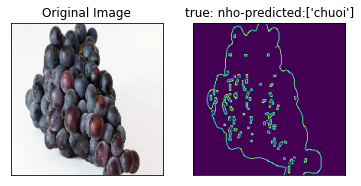

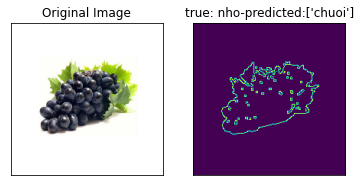

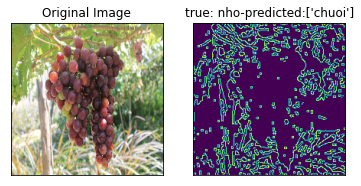

...

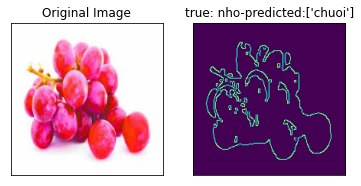

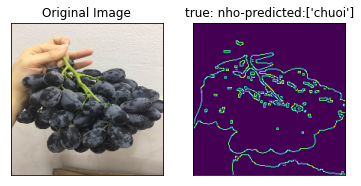

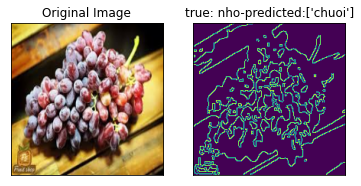

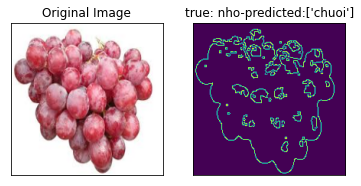

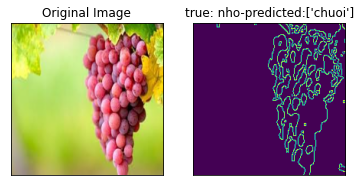

21/21 wrong
quyt


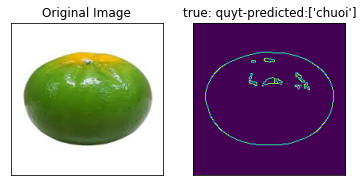

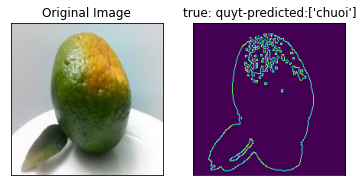

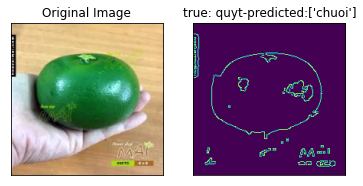

3/3 wrong
xoai


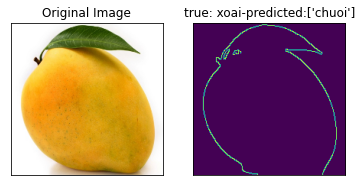

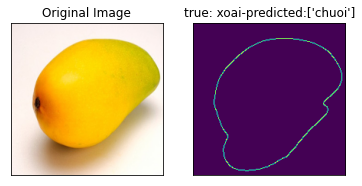

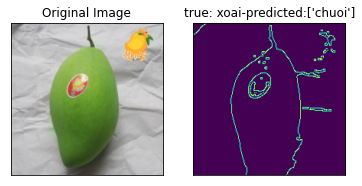

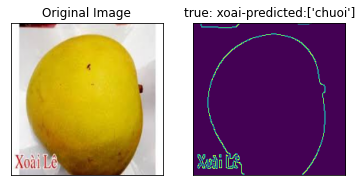

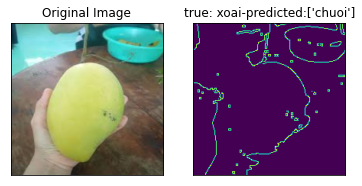

...

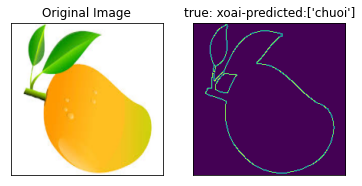

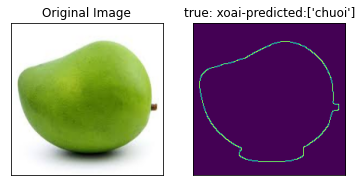

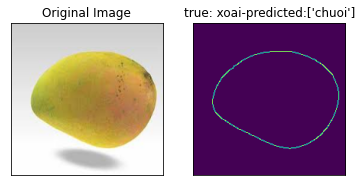

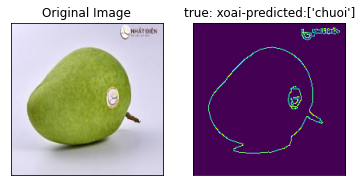

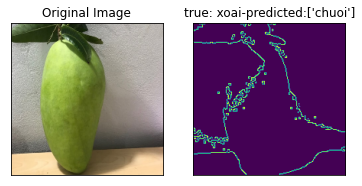

21/21 wrong
thom


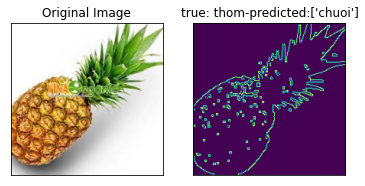

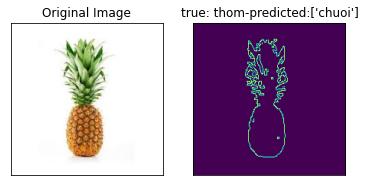

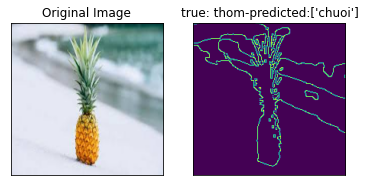

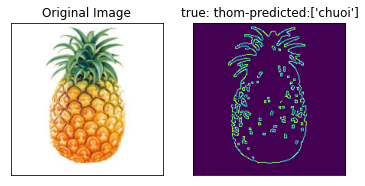

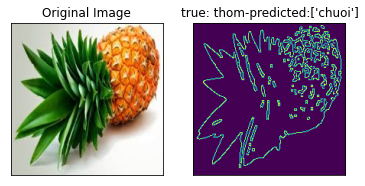

...

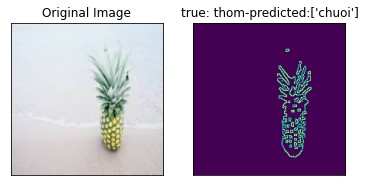

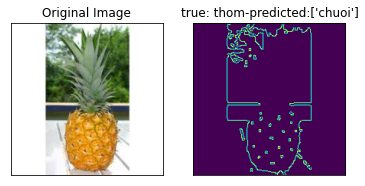

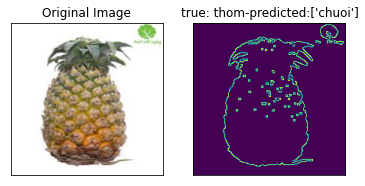

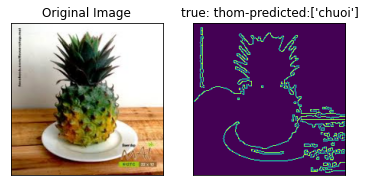

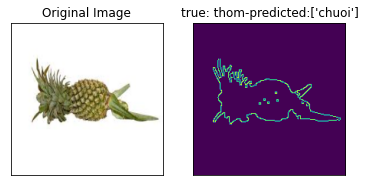

21/21 wrong
ca chua


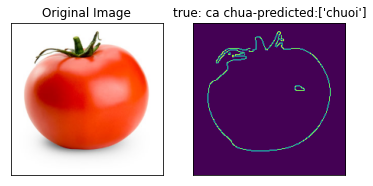

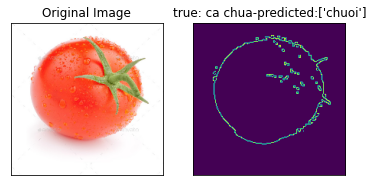

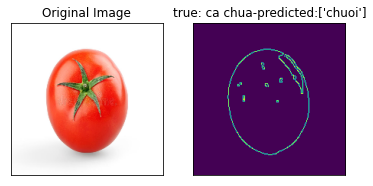

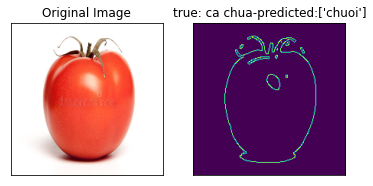

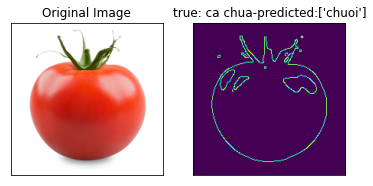

...

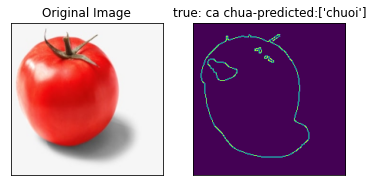

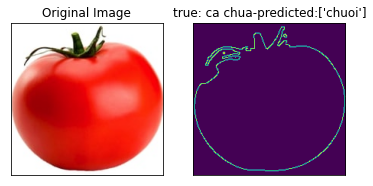

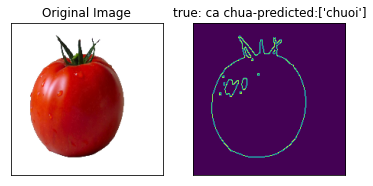

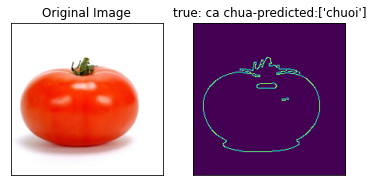

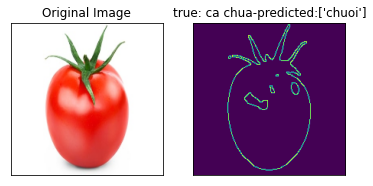

20/20 wrong
cam


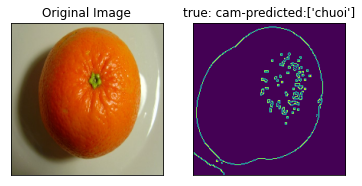

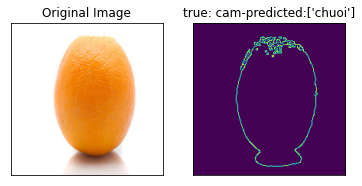

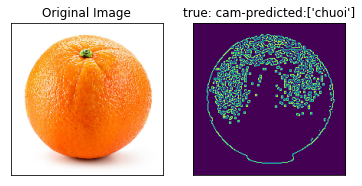

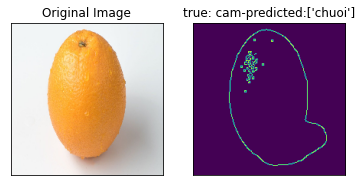

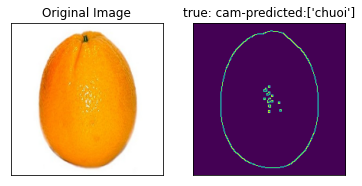

...

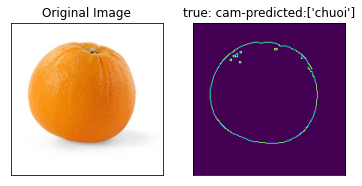

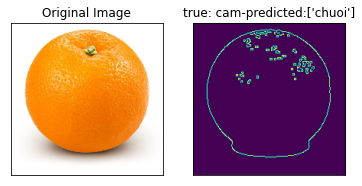

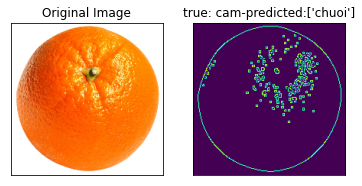

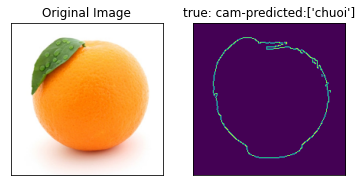

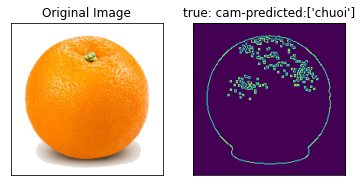

19/19 wrong
chuoi


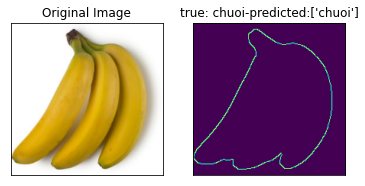

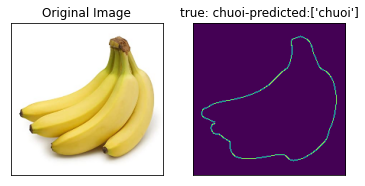

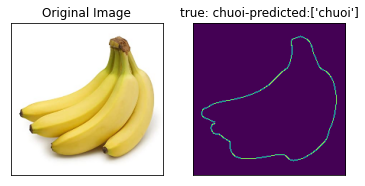

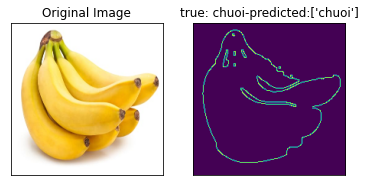

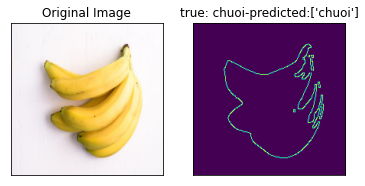

...

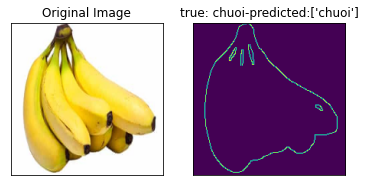

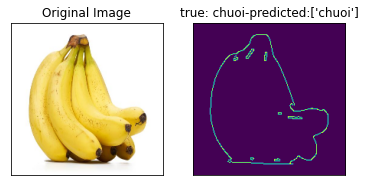

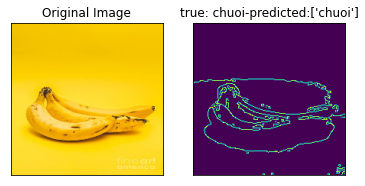

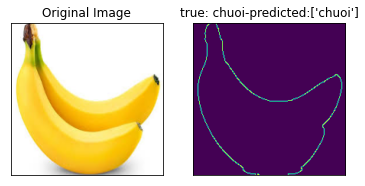

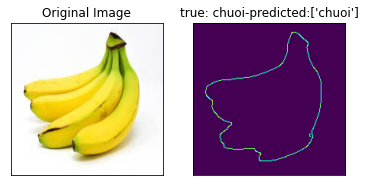

0/22 wrong
dua hau


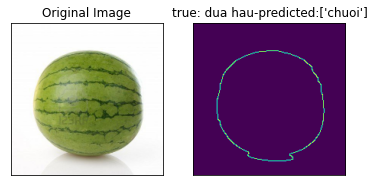

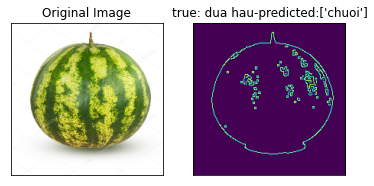

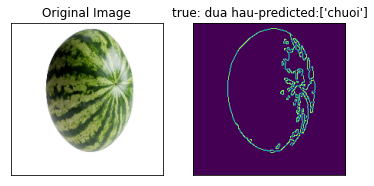

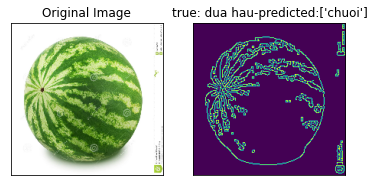

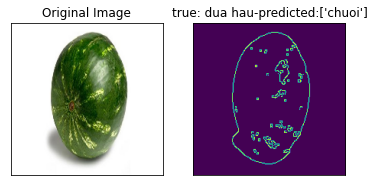

...

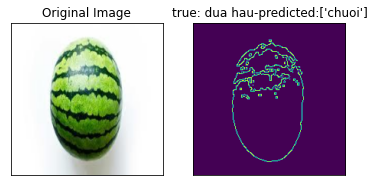

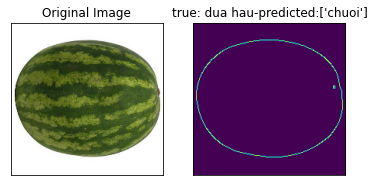

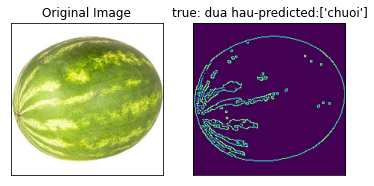

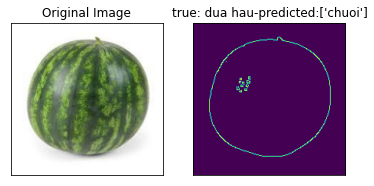

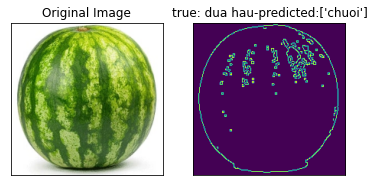

19/19 wrong
le


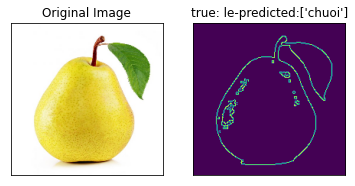

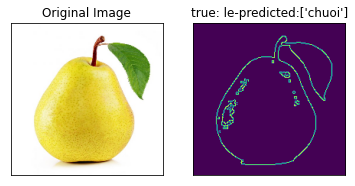

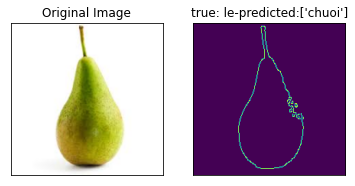

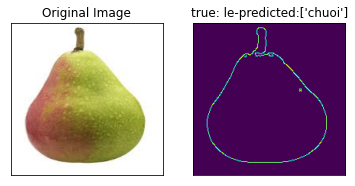

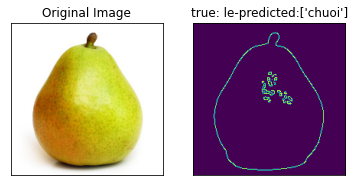

...

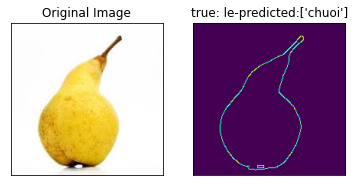

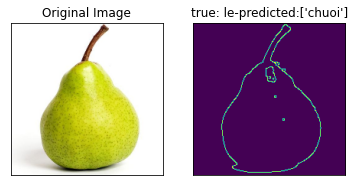

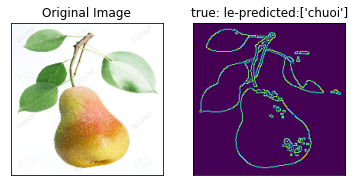

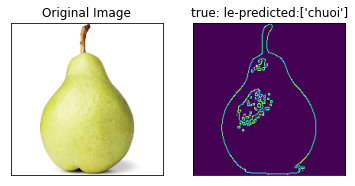

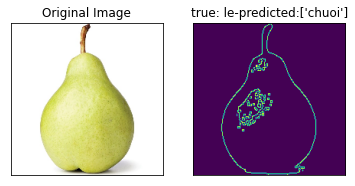

21/21 wrong


In [19]:
path = '/content/drive/My Drive/Fruit recognition/valid data '
file_name = os.listdir(path)
for name in file_name:
  total = 0
  wrong = 0
  print(name)
  for image in os.listdir(path+'/'+name):
    #print(path+'/'+name+'/'+image)
    img = cv2.imread(path+'/'+name+'/'+image)
    resized_img = cv2.resize(img, (200, 200))
    resized_img = cv2.cvtColor(resized_img,cv2.COLOR_BGR2RGB)

    final_df = create_df_with_one_image2(resized_img)

    predicted_label = svc.predict(final_df)
    if predicted_label != name:
      wrong+=1
    total+=1

    figure_size = 6
    plt.figure(figsize=(figure_size,figure_size))

    plt.subplot(1,2,1)
    plt.imshow(resized_img)
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])

    plt.subplot(1,2,2)
    plt.imshow(Canny(resized_img))
    plt.title('true: {}-predicted:{}'.format(name, predicted_label)), plt.xticks([]), plt.yticks([])

    plt.show()
  print('{}/{} wrong'.format(wrong, total))